# Proyek Klasifikasi Gambar: Fruits 360 Original Size (60 Kelas)
- **Nama:** Daniel Siahaan
- **Email:** lisnarda.siregar1212@gmail.com
- **ID Dicoding:** nielshn11
- **Dataset:** Fruits 360 - Original Size Branch (60 Classes, 39,661 Images)


## Import Semua Packages/Library yang Digunakan

In [1]:

import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from PIL import Image
import random


## Data Preparation

### Data Loading

In [ ]:
from PIL import Image

def print_images_resolution(directory):
    unique_sizes = set()
    total_images = 0

    for subdir in os.listdir(directory):
        subdir_path = os.path.join(directory, subdir)
        if not os.path.isdir(subdir_path):
            continue
        image_files = os.listdir(subdir_path)
        num_images = len(image_files)
        print(f"{subdir}: {num_images}")
        total_images += num_images

        for img_file in image_files:
            img_path = os.path.join(subdir_path, img_file)
            with Image.open(img_path) as img:
                unique_sizes.add(img.size)

        for size in unique_sizes:
            print(f"- {size}")
        print("---------------")

    print(f"\nTotal: {total_images}")

# Contoh panggilan:
print_images_resolution("./dataset/fruits-360-original-size/Training/")


Apple 10: 465
- (471, 399)
- (477, 442)
- (429, 402)
- (458, 447)
- (415, 485)
- (450, 452)
- (461, 452)
- (485, 437)
- (419, 482)
- (472, 485)
- (459, 393)
- (459, 402)
- (423, 479)
- (416, 449)
- (445, 485)
- (411, 483)
- (460, 394)
- (460, 403)
- (461, 447)
- (452, 398)
- (470, 434)
- (408, 450)
- (433, 394)
- (463, 395)
- (419, 450)
- (389, 482)
- (425, 395)
- (417, 400)
- (456, 400)
- (437, 396)
- (471, 398)
- (415, 484)
- (439, 451)
- (427, 449)
- (461, 451)
- (456, 485)
- (432, 402)
- (484, 440)
- (420, 446)
- (441, 478)
- (423, 451)
- (453, 452)
- (422, 483)
- (459, 401)
- (428, 395)
- (395, 483)
- (470, 397)
- (407, 484)
- (442, 451)
- (463, 394)
- (463, 403)
- (455, 399)
- (431, 441)
- (435, 402)
- (414, 483)
- (458, 400)
- (434, 479)
- (445, 479)
- (438, 440)
- (426, 484)
- (478, 485)
- (392, 482)
- (470, 401)
- (469, 445)
- (479, 486)
- (464, 452)
- (421, 481)
- (447, 399)
- (422, 482)
- (399, 480)
- (403, 450)
- (383, 481)
- (450, 400)
- (384, 482)
- (425, 483)
- (443, 397

### Data Preprocessing

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = (100, 100)
BATCH_SIZE = 32

# Augmentasi hanya untuk training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    "./dataset/fruits-360-original-size/Training",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    "./dataset/fruits-360-original-size/Validation",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    "./dataset/fruits-360-original-size/Test",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)


Found 19852 images belonging to 60 classes.
Found 9928 images belonging to 60 classes.
Found 9881 images belonging to 60 classes.


## Modelling

In [ ]:
# Arsitektur CNN
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)),
    MaxPooling2D(2, 2),

    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),

    Flatten(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dense(60, activation='softmax')  # 60 classes
])

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()


c:\Users\Asus\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 49, 49, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 47, 47, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 21, 21, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,638,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 60)             │         7,740 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,739,516 (6.64 MB)

 Trainable params: 1,739,516 (6.64 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

checkpoint_cb = ModelCheckpoint("best_model.h5", save_best_only=True)
earlystop_cb = EarlyStopping(patience=5, restore_best_weights=True)


In [ ]:
history = model.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    callbacks=[checkpoint_cb, earlystop_cb]
)


c:\Users\Asus\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.3307 - loss: 2.4788

621/621 ━━━━━━━━━━━━━━━━━━━━ 186s 298ms/step - accuracy: 0.3310 - loss: 2.4773 - val_accuracy: 0.8660 - val_loss: 0.3436
Epoch 2/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - accuracy: 0.8111 - loss: 0.5308

621/621 ━━━━━━━━━━━━━━━━━━━━ 87s 140ms/step - accuracy: 0.8112 - loss: 0.5306 - val_accuracy: 0.9487 - val_loss: 0.1347
Epoch 3/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.8807 - loss: 0.3278

621/621 ━━━━━━━━━━━━━━━━━━━━ 80s 129ms/step - accuracy: 0.8807 - loss: 0.3277 - val_accuracy: 0.9739 - val_loss: 0.0779
Epoch 4/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 79s 128ms/step - accuracy: 0.9108 - loss: 0.2470 - val_accuracy: 0.9576 - val_loss: 0.1069
Epoch 5/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.9271 - loss: 0.2010

621/621 ━━━━━━━━━━━━━━━━━━━━ 80s 129ms/step - accuracy: 0.9271 - loss: 0.2011 - val_accuracy: 0.9858 - val_loss: 0.0488
Epoch 6/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 79s 127ms/step - accuracy: 0.9360 - loss: 0.1754 - val_accuracy: 0.9771 - val_loss: 0.0589
Epoch 7/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.9397 - loss: 0.1665

621/621 ━━━━━━━━━━━━━━━━━━━━ 197s 317ms/step - accuracy: 0.9397 - loss: 0.1664 - val_accuracy: 0.9873 - val_loss: 0.0443
Epoch 8/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - accuracy: 0.9514 - loss: 0.1363

621/621 ━━━━━━━━━━━━━━━━━━━━ 102s 165ms/step - accuracy: 0.9514 - loss: 0.1364 - val_accuracy: 0.9890 - val_loss: 0.0313
Epoch 9/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 237s 382ms/step - accuracy: 0.9560 - loss: 0.1244 - val_accuracy: 0.9880 - val_loss: 0.0333
Epoch 10/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 113s 182ms/step - accuracy: 0.9558 - loss: 0.1313 - val_accuracy: 0.9834 - val_loss: 0.0471
Epoch 11/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 75s 121ms/step - accuracy: 0.9630 - loss: 0.1108 - val_accuracy: 0.9813 - val_loss: 0.0407
Epoch 12/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - accuracy: 0.9651 - loss: 0.0982

621/621 ━━━━━━━━━━━━━━━━━━━━ 79s 126ms/step - accuracy: 0.9651 - loss: 0.0982 - val_accuracy: 0.9981 - val_loss: 0.0110
Epoch 13/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 86s 138ms/step - accuracy: 0.9658 - loss: 0.1030 - val_accuracy: 0.9922 - val_loss: 0.0313
Epoch 14/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 85s 136ms/step - accuracy: 0.9688 - loss: 0.0850 - val_accuracy: 0.9961 - val_loss: 0.0198
Epoch 15/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 87s 140ms/step - accuracy: 0.9625 - loss: 0.1085 - val_accuracy: 0.9774 - val_loss: 0.0573
Epoch 16/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 88s 141ms/step - accuracy: 0.9688 - loss: 0.0928 - val_accuracy: 0.9906 - val_loss: 0.0300
Epoch 17/30
621/621 ━━━━━━━━━━━━━━━━━━━━ 90s 145ms/step - accuracy: 0.9660 - loss: 0.1036 - val_accuracy: 0.9834 - val_loss: 0.0449


## Evaluasi dan Visualisasi

In [ ]:
# Evaluasi performa model di test set
test_loss, test_acc = model.evaluate(test_generator, verbose=1)
print(f"\nTest Accuracy: {test_acc * 100:.2f}%")
print(f"Test Loss: {test_loss:.4f}")

c:\Users\Asus\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


309/309 ━━━━━━━━━━━━━━━━━━━━ 88s 287ms/step - accuracy: 0.9984 - loss: 0.0068

Test Accuracy: 99.80%
Test Loss: 0.0108


309/309 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step


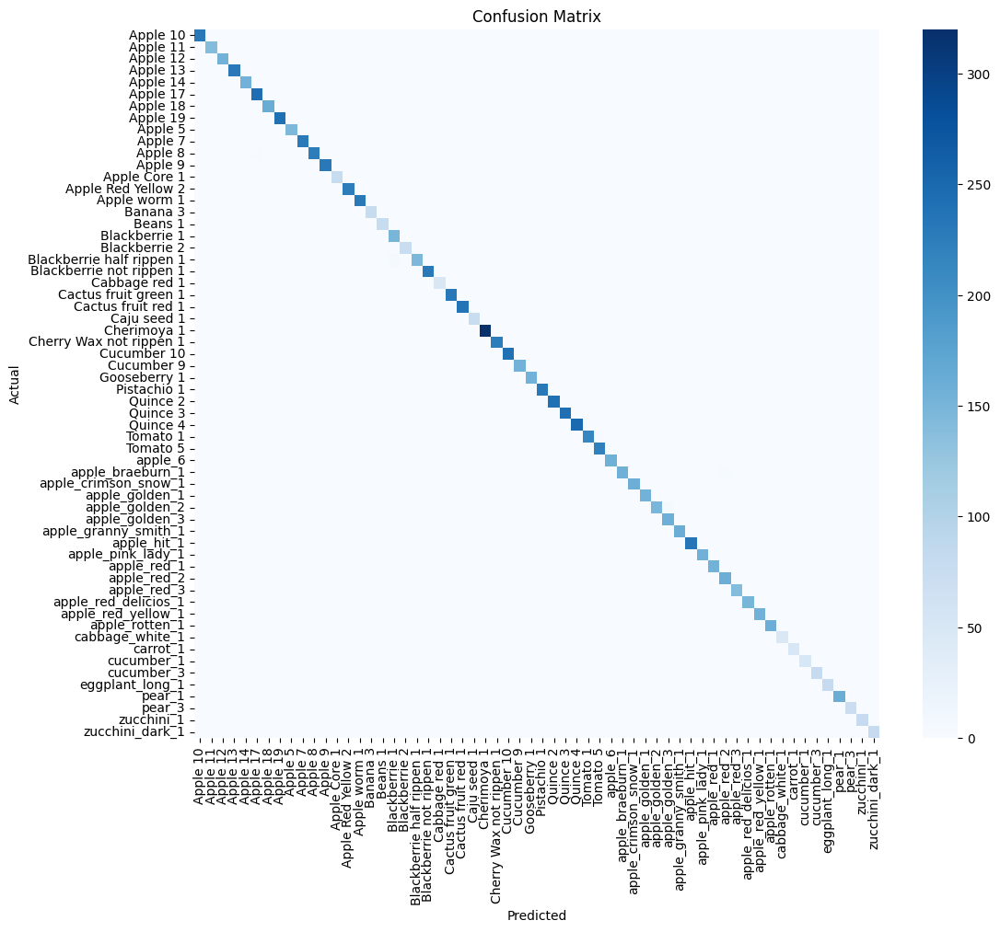

Classification Report:

                           precision    recall  f1-score   support

                 Apple 10       1.00      1.00      1.00       231
                 Apple 11       1.00      0.99      1.00       142
                 Apple 12       1.00      1.00      1.00       154
                 Apple 13       1.00      1.00      1.00       231
                 Apple 14       1.00      1.00      1.00       154
                 Apple 17       0.99      1.00      1.00       243
                 Apple 18       1.00      1.00      1.00       162
                 Apple 19       1.00      1.00      1.00       241
                  Apple 5       1.00      1.00      1.00       146
                  Apple 7       1.00      1.00      1.00       229
                  Apple 8       1.00      0.99      1.00       228
                  Apple 9       1.00      1.00      1.00       231
             Apple Core 1       1.00      1.00      1.00        78
       Apple Red Yellow 2       1.00 

In [ ]:
# Confusion Matrix & Classification Report
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Prediksi di test set
y_pred_probs = model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, xticklabels=class_labels, yticklabels=class_labels,annot=False, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


# Classification Report
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

## Konversi Model

In [ ]:
# Export model ke SavedModel format (buat TFLite, TFJS)
model.export("fruits360_savedmodel")

INFO:tensorflow:Assets written to: fruits360_savedmodel\assets


INFO:tensorflow:Assets written to: fruits360_savedmodel\assets


Saved artifact at 'fruits360_savedmodel'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 100, 100, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 60), dtype=tf.float32, name=None)
Captures:
  2245696902864: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2245696904016: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2245696905168: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2245696902096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2245696904592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2245696905936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2245696904208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2245696906896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2245696905552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2245696908240: TensorSpec(shape=(), dtype=tf.resource, name=None)


In [2]:
# Konversi ke TF-Lite
converter = tf.lite.TFLiteConverter.from_saved_model("fruits360_savedmodel")
tflite_model = converter.convert()

# Simpan file TFLite
with open("fruits360_model.tflite", "wb") as f:
    f.write(tflite_model)


## Inference (Optional)

In [ ]:
from tensorflow.keras.preprocessing import image
model.save("fruits360_model.keras")

# Load ulang model
model = tf.keras.models.load_model("fruits360_model.keras")

# Contoh prediksi dari file
img_path = "./dataset/fruits-360-original-size/Test/Apple 10/r0_103.jpg"  # ganti path sesuai dataset kamu
img = image.load_img(img_path, target_size=(100, 100))
img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

pred = model.predict(img_array)
predicted_class = np.argmax(pred[0])
class_names = list(train_generator.class_indices.keys())

print("Predicted class:", class_names[predicted_class])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Predicted class: Apple 10


c:\Users\Asus\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 12 variables whereas the saved optimizer has 22 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
# Load TF-Lite model
interpreter = tf.lite.Interpreter(model_path="fruits360_model.tflite")
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Preprocess image
img = image.load_img(img_path, target_size=(100, 100))
input_data = image.img_to_array(img) / 255.0
input_data = np.expand_dims(input_data, axis=0).astype(np.float32)

# Run inference
interpreter.set_tensor(input_details[0]['index'], input_data)
interpreter.invoke()

output_data = interpreter.get_tensor(output_details[0]['index'])
predicted_class = np.argmax(output_data)
print("Predicted class (TF-Lite):", class_names[predicted_class])


Predicted class (TF-Lite): Apple 10


In [1]:
!unzip fruits360_savedmodel.zip

Archive:  fruits360_savedmodel.zip
   creating: fruits360_savedmodel/
   creating: fruits360_savedmodel/assets/
  inflating: fruits360_savedmodel/fingerprint.pb  
  inflating: fruits360_savedmodel/saved_model.pb  
   creating: fruits360_savedmodel/variables/
  inflating: fruits360_savedmodel/variables/variables.data-00000-of-00001  
  inflating: fruits360_savedmodel/variables/variables.index  


In [5]:
!pip install tensorflowjs


  Using cached tensorflowjs-4.22.0-py3-none-any.whl.metadata (3.2 kB)
  Using cached tensorflow_decision_forests-1.12.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.3 kB)
  Using cached packaging-23.2-py3-none-any.whl.metadata (3.2 kB)
  Using cached tensorflow-2.19.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.1 kB)
  Using cached wurlitzer-3.1.1-py3-none-any.whl.metadata (2.5 kB)
  Using cached tf_keras-2.19.0-py3-none-any.whl.metadata (1.8 kB)
  Using cached ydf-0.11.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.5 kB)
  Using cached tensorboard-2.19.0-py3-none-any.whl.metadata (1.8 kB)
  Using cached ml_dtypes-0.5.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (21 kB)
Using cached tensorflowjs-4.22.0-py3-none-any.whl (89 kB)
Using cached packaging-23.2-py3-none-any.whl (53 kB)
Using cached tensorflow_decision_forests-1.12.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl

In [6]:
!tensorflowjs_converter \
  --input_format=tf_saved_model \
  --output_format=tfjs_graph_model \
  fruits360_savedmodel \
  fruits360_tfjs_model


2025-04-10 15:23:52.515516: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744298632.636485   16988 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744298632.720205   16988 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1744298632.854441   16988 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1744298632.858948   16988 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1744298632.859002   16988 computation_placer.cc:177] computation placer alr